<a href="https://colab.research.google.com/github/allenphos/ML-course-ua-/blob/main/Copy_of_HW_2_5_Time_Series_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

У цьому ДЗ ми попрактикуємось моделювати часові ряди на даних з [Store Item Demand Forecasting Challenge](https://www.kaggle.com/competitions/demand-forecasting-kernels-only/overview). Ми будемо працювати лише з тренувальними даними цього змагання і задача у нас буде дещо змінена. Фокус буде на пошуці найкращої моделі, експериментах і використанні функціоналу `darts`.

Якщо якісно попрацювати в цьому завданні - це буде чудовий приклад проєкту для вашого портфоліо: "спрогнозував(-ла) поденні продажі на 1 міс для 50 товарів в 10 магазинах" звучить вражаюче! Але ми в рамках ДЗ для оптимізації часу сконцентруємось на моделюванні продажів одного товару в одному магазині.

**Задача**

Вам надано дані про продажі товарів у магазинах за 5 років. Хочемо навчитись передачати продажі в наступному місяці поденно кожного з 50 товарів у кожному з 10 магазинів. Відповідно будемо проводити експерименти, аби знайти найкращу модель для цього.

На відміну від змагання, ми будемо використовувати метрику МАРЕ (Mean Absolute Percentage Error) замість SMAPE (Symmetric Mean Absolute Percentage Error). Проте, ви також можете розрахувати SMAPE і подати свої результати через late submission на Kaggle.

1. Завантажуємо дані в Pandas.

  1. Завантажте дані з файлу `train.csv.zip` за допомогою бібліотеки Pandas.
  2. Перетворіть колонку `date` на формат `datetime`.
  3. Встановіть колонку `date` як індекс для датафрейму.
  4. Виведіть перші 10 рядків отриманого датафрейму та інформацію про датафрейм.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Imports

In [3]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict
import statsmodels.api as sm
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from statsmodels.tsa.seasonal import seasonal_decompose

In [4]:
df = pd.read_csv('drive/MyDrive/Colab Notebooks/data//train.csv')

df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

df.head(10)

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10
2013-01-06,1,1,12
2013-01-07,1,1,10
2013-01-08,1,1,9
2013-01-09,1,1,12


In [5]:
df

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10
...,...,...,...
2017-12-27,10,50,63
2017-12-28,10,50,59
2017-12-29,10,50,74


  2. Давайте трошки зрозуміємо дані. У нас 10 магазинів і 50 айтемів в кожному. Хочемо зрозуміти, чи відрізняється динаміка по кожному айтему в магазинах. Як би ви це візуалізували? Побудуйте 3 графіка, які вам допоможуть. Можна використати будь-який інструмент: matplotlib, seaborn, plotly.

  Напишіть висновок з побудованих вами візуалізацій.
  
    **Підказка**: я б спробувала вивести середнє значення і довірчий інтервал (який включає весь діапазон значень з різних магазинів) для динаміки кожного айтема, або принаймні для декількох айтемів, аби зрозуміти тенденцію.



In [6]:
# Calculate the mean sales per item for each date
item_mean_sales_by_date = df.groupby(['date', 'item'])['sales'].mean().reset_index() # roups all rows that have the same item together, take only the sales values for each group

# Now, you can create your Plotly Express line chart
fig = px.line(item_mean_sales_by_date, x='date', y='sales', color='item')

fig.update_layout(template="simple_white", font=dict(size=18),
                  title_text='item', width=950, title_x=0.5, height=500)

fig.show()

In [7]:
fig = px.line(item_mean_sales_by_date, x='date', y='sales', color='item',
              facet_col="item", facet_col_wrap=5, title="Sales Trend per Item")

fig.update_layout(template="simple_white", font=dict(size=12),
                  width=1200, height=900)

fig.show()

Довірчий інтервал (Confidence Interval, CI) — це інтервал значень, в якому, з певною ймовірністю (наприклад, 95%), знаходиться істинне середнє значення генеральної сукупності.

In [9]:
import plotly.graph_objects as go
import plotly.express as px

# Compute confidence intervals efficiently
grouped = df.groupby(["date", "item"])["sales"]
mean_sales = grouped.mean()
std_err = grouped.sem()
n = grouped.count()

# Compute confidence intervals
ci_range = stats.t.ppf(0.975, df=n-1) * std_err

# Create a DataFrame for analysis
item_analysis = pd.DataFrame({
    "sales": mean_sales,
    "Lower Bound": mean_sales - ci_range,
    "Upper Bound": mean_sales + ci_range
}).reset_index()

# Ensure all values are numeric
item_analysis["Lower Bound"] = pd.to_numeric(item_analysis["Lower Bound"], errors="coerce")
item_analysis["Upper Bound"] = pd.to_numeric(item_analysis["Upper Bound"], errors="coerce")

# Drop any remaining NaN or infinite values
item_analysis = item_analysis.replace([np.inf, -np.inf], np.nan).dropna()


In [11]:
# Dropdown Selection for Items with Confidence Intervals
fig = go.Figure()

# Add a dropdown menu
items = df["item"].unique()

for item in items:
    subset = item_analysis[item_analysis["item"] == item]
    fig.add_trace(go.Scatter(
        x=subset["date"], y=subset["sales"],
        mode="lines", name=f"Item {item}",
        visible=False))

    # Add confidence intervals as shaded area
    fig.add_trace(go.Scatter(
        x=subset["date"].tolist() + subset["date"].tolist()[::-1],
        y=subset["Upper Bound"].tolist() + subset["Lower Bound"].tolist()[::-1],
        fill="toself",
        fillcolor="rgba(0, 0, 255, 0.2)",  # Light blue shading
        line=dict(color="rgba(255,255,255,0)"),
        showlegend=False,
        visible=False,
        name=f"95% CI for Item {item}"
    ))

# Make the first item visible by default
fig.data[0].visible = True
fig.data[1].visible = True

# Create dropdown options
dropdown_buttons = [
    dict(label=f"Item {item}",
         method="update",
         args=[{"visible": [i == 2*idx or i == 2*idx+1 for i in range(len(items)*2)]}])
    for idx, item in enumerate(items)
]

fig.update_layout(
    title="Select an Item to View Sales Trend with Confidence Intervals",
    updatemenus=[dict(active=0, buttons=dropdown_buttons, x=0.15, y=1.15)],
    template="simple_white",
    font=dict(size=14),
    width=1000, height=600
)

fig.show()


In [13]:
import plotly.express as px

selected_item = 1

fig = px.box(df[df["item"] == selected_item], x="store", y="sales", title=f"Розподіл продажів по магазинах для айтема {selected_item}")
fig.show()

На графіках спостерігається сезонність із річним циклом, що характеризується піковими продажами влітку. Також видно загальну тенденцію зростання продажів з роками та позитивний тренд.

## Decomposition

3. **Для початку проаналізуємо лише один ряд, а далі зможемо зациклити тренування моделей.**
  
  Виберіть підмножину даних, що відповідає продажам товару з `item == 1` у магазині з `store == 1`.

  Зробіть декомпозицію цього рядку за адитивною моделлю на тренд, сезонність і залишки з бібліотекою `statsmodels`.

  Зробіть висновки з отриманих візуалізацій. Чи щось би могло вам допомогти ліпше зрозуміти ці візуалізації? (з точки зору обробки даних)

resid  count    1462.000000
mean        0.000069
std         4.587162
min       -17.657465
25%        -3.048218
50%        -0.092739
75%         3.236542
max        17.908289
Name: resid, dtype: float64


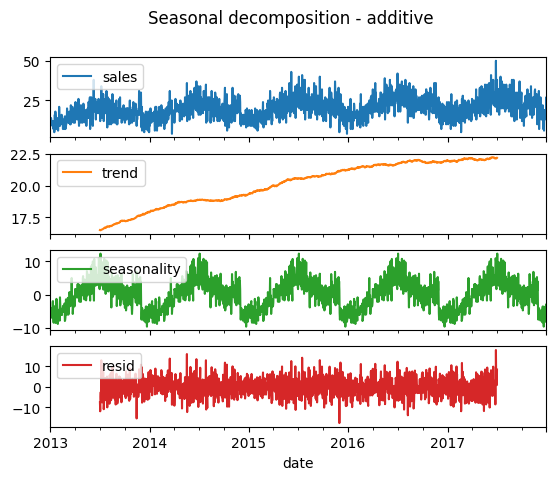

In [14]:
import statsmodels.api as sm

# Select the subset for item 1 in store 1
subset = df[(df["item"] == 1) & (df["store"] == 1)].copy()

# Ensure data is sorted by date
subset = subset.sort_index()

# Perform seasonal decomposition using an additive model
decomposition = sm.tsa.seasonal_decompose(subset["sales"], model="additive", period=365)

# Extract components
subset["trend"] = decomposition.trend
subset["seasonality"] = decomposition.seasonal
subset["resid"] = decomposition.resid

print('resid ', subset["resid"].describe())
(
    subset
    .loc[:, ["sales", "trend", "seasonality", "resid"]]
    .plot(subplots=True, title="Seasonal decomposition - additive")
);

Залишки наче не містять паттерн і середнє в нулі, що добрий знак. По сезонності можно побачити коли спрос на товар найбільший - на веснянні свята, влітку та на Різдво. Тренд показує зростання продажів з часом.

## Тести на стаціонарність
ADF тест (Augmented Dickey-Fuller Test)

ADF тест використовується для перевірки гіпотези про наявність одиничного кореня в часовому ряді, що свідчить про нестаціонарність.

Нульова гіпотеза (H0): Ряд має одиничний корінь (нестабільний).
Альтернативна гіпотеза (H1): Ряд стаціонарний.

Результат тесту дає p-значення. Якщо p-значення менше за обраний рівень значущості (наприклад, 0.05), нульова гіпотеза відхиляється, і ряд вважається стаціонарним.

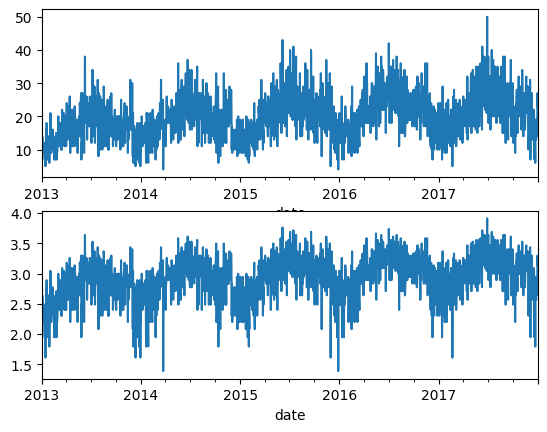

In [17]:
plt.subplot(2, 1, 1)
subset.sales.plot()
plt.subplot(2, 1, 2)
np.log(subset.sales).plot();

In [18]:
from statsmodels.tsa.stattools import adfuller

# Виконання ADF тесту
result = adfuller(subset['sales'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -3.157671
p-value: 0.022569
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568


Значення ADF Statistic (-3.15) є меншим за  5% critical value (-2.863), тому можно відхилити нульову гіпотезу про не стаціонарність. А p-value 0.02 менше за 0.05, що підкреслює те, що ряд не має одиничного кореня (тобто є стаціонарним).  Це означає, що часовий ряд, ймовірно, є стаціонарним на рівні довірчої ймовірності 5%, тобто має постійне середнє, дисперсію та автокореляцію в часі.

4. Зі створеної підможени даних в попередньому пункті створіть обʼєкт класу `TimeSeries` в `darts` лише для колонки `sales`.

In [19]:
!pip install darts --quiet

In [20]:
from darts import TimeSeries

# Завантаження даних в darts, індекс був перетворений в Darts індекс автоматично
series = TimeSeries.from_dataframe(subset, value_cols='sales')

<Axes: xlabel='date'>

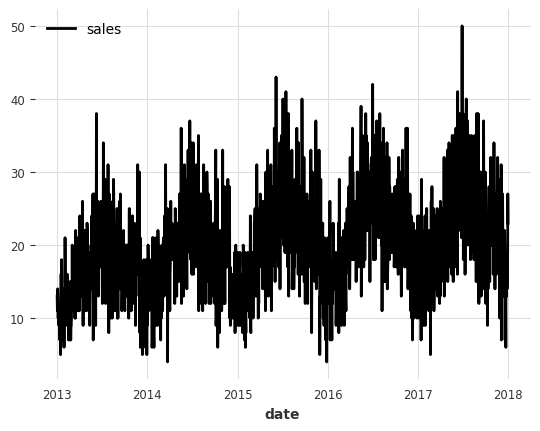

In [21]:
series.plot()

5. Використовуючи метод `series.split_before` розбийте дані на тренування і валідацію так, аби валідація починалась з `2017-10-01` включно.

  Візуалізуйте на одному графіку тренувальну і валідаційну частину як було показано в лекції.

<Axes: xlabel='date'>

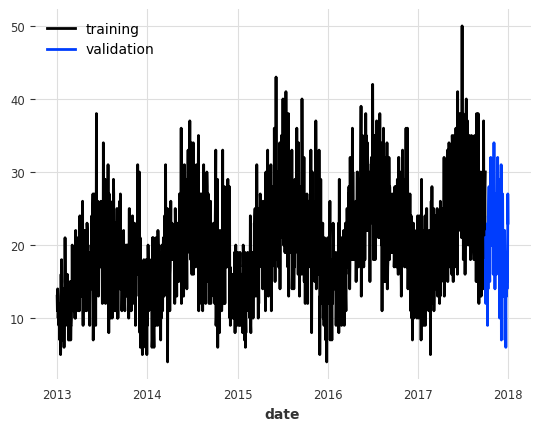

In [22]:
train, val = series.split_before(pd.Timestamp("2017-10-01"))
train.plot(label="training")
val.plot(label="validation")

6. Побудуйте часткову автокореляційну фукнцію для цього нашого ряду в `series`. Напишіть висновки - які лаги є важливими для прогнозування?

<Figure size 1000x600 with 0 Axes>

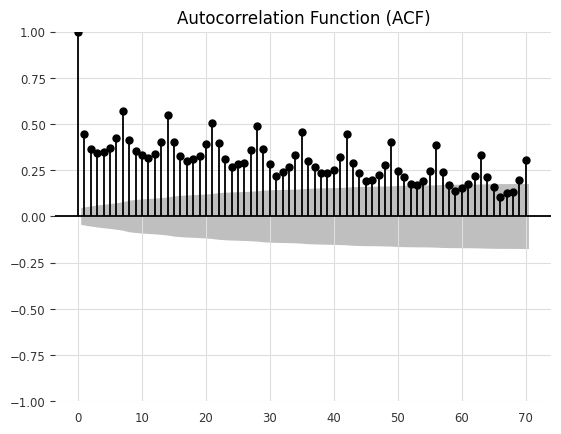

In [23]:
from statsmodels.graphics.tsaplots import plot_acf

# Convert the darts TimeSeries object to a pandas Series
series_values = series.pd_series()

plt.figure(figsize=(10, 6))
plot_acf(series_values, lags=70)
plt.title('Autocorrelation Function (ACF)')
plt.show();

Можна побачити на графіку, що значення автокореляції зменшуються з лагом  (інтервалу часу). Це свідчить про позитивну автокореляцію на малих лагах. Коливання вказують на наявність сезоних патернів в даних. Перші 50 лагів та періодичні пікові лаги знаходяться вище затемненої зони - довірчого інтервалу, тобто є статистично значущими.  

7. Виявіть сезональність тренувального ряду використовуючи фукнкцію `check_seasonality` з `darts`.

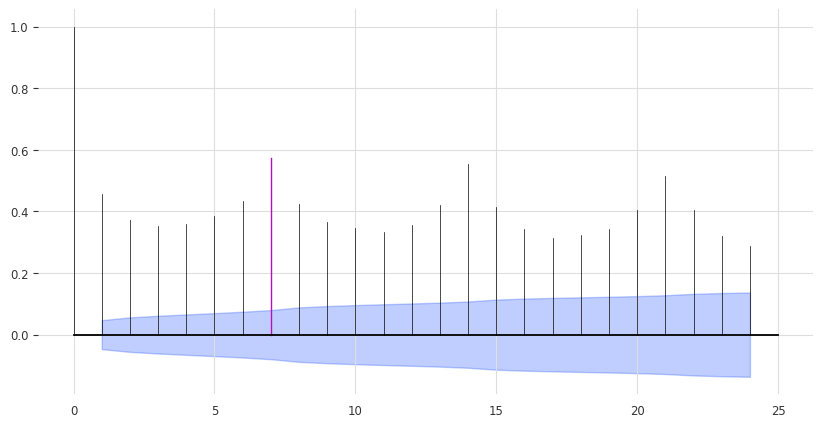

In [24]:
from darts.utils.statistics import plot_acf, check_seasonality

plot_acf(train, m=7, alpha=0.05, max_lag=24)

ACF показує пік при x = 7, що вказує на річну сезонну тенденцію. Синя зона визначає значущість статистики для рівня довіри  α=5% . Ми також можемо провести статистичну перевірку сезонності для кожного кандидата періоду m:

In [25]:
#статистичну перевірку сезонності для кожного кандидата періоду m
for m in range(2, 25):
    is_seasonal, period = check_seasonality(train, m=m, alpha=0.05)
    if is_seasonal:
        print("There is seasonality of order {}.".format(period))

There is seasonality of order 7.
There is seasonality of order 14.
There is seasonality of order 21.


## NaiveSeasonal

8. Побудуйте наївну модель NaiveSeasonal + NaieDrift для прогнозування даних. Кількість кроків для прогнозування визначіть зі свого аналізу в попередніх пунктах. Візуалізайте передбачення проти справжніх даних так, аби було видно якість передбачень. Зробіть висновок про модель. Вона точна?

  Якщо у вас є ідеї, як поліпшити якість передбачення саме наївними моделями - реалізуйте їх в цьому пункті :)

NaiveSeasonal(K) завжди "повторює" значення, яке відбулося K кроків тому.

У своїй найнаївнішій формі, коли K=1, ця модель просто завжди повторює останнє значення навчальної серії:

In [27]:
import numpy
import darts
import pmdarima
import tensorflow


print("Numpy version:", numpy.__version__)
print("Darts version:", darts.__version__)
print("pmdarima version:", pmdarima.__version__)
print("TensorFlow version:", tensorflow.__version__)

Numpy version: 1.26.4
Darts version: 0.34.0
pmdarima version: 2.0.4
TensorFlow version: 2.18.0


<Axes: xlabel='date'>

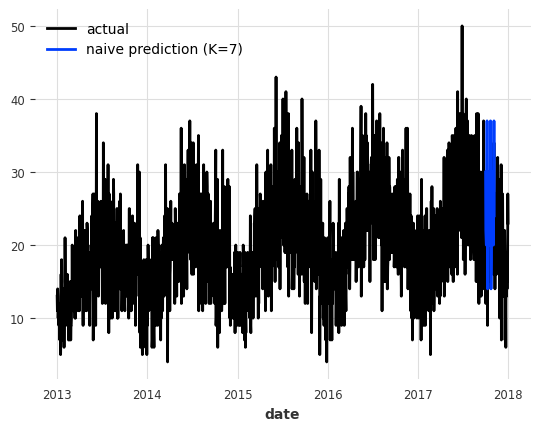

In [34]:
from darts.models import NaiveSeasonal

seasonal_model = NaiveSeasonal(K=14)
seasonal_model.fit(train)
seasonal_forecast = seasonal_model.predict(36)

series.plot(label="actual")
seasonal_forecast.plot(label="naive prediction (K=7)")

Наївна модель не захоплює тренд і не виглядає дуже точною.

<Axes: xlabel='date'>

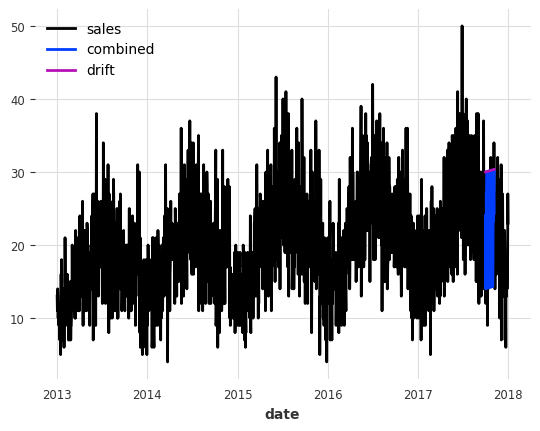

In [31]:
from darts.models import NaiveDrift

drift_model = NaiveDrift()
drift_model.fit(train)
drift_forecast = drift_model.predict(36)

combined_forecast = drift_forecast + seasonal_forecast - train.last_value()

series.plot()
combined_forecast.plot(label="combined")
drift_forecast.plot(label="drift")

Прогноз дріфтової комбінованої моделі виглядає краще наївної, але все ще не показує тренд.

9. Обчисліть помилку прогнозу на валідації наївною моделлю з mape. Далі для всіх моделей необхідно обчислювати помилку прогнозу на валідації.

In [37]:
from darts.metrics import mape

print(
    f"Mean absolute percentage error for the combined naive drift + seasonal: {mape(val, combined_forecast):.2f}%."
)

Mean absolute percentage error for the combined naive drift + seasonal: 29.39%.


10. Натренуйте XBGModel з `darts` для передбачення наших даних. Можна додавати всі додаткові ознаки, які вважаєте за потрібне, наприклад, ознаки з дати. Зробіть висновок про якість моделі.

In [38]:
train.pd_dataframe()

component,sales
date,
2013-01-01,13.0
2013-01-02,11.0
2013-01-03,14.0
2013-01-04,13.0
2013-01-05,10.0
...,...
2017-09-26,18.0
2017-09-27,27.0
2017-09-28,23.0


In [98]:
from darts.models import XGBModel
from darts.dataprocessing.transformers import Scaler

def enrich_with_date_features(df):
  # Feature Extraction - help models understand temporal patterns
  df["hour"] = df['date'].dt.hour
  df["dayofweek"] = df['date'].dt.dayofweek
  df["quarter"] = df['date'].dt.quarter
  df["month"] = df['date'].dt.month
  df["year"] = df['date'].dt.year
  df["dayofyear"] = df['date'].dt.dayofyear
  df["sin_day"] = np.sin(df["dayofyear"]) # create cyclic representations of the year to capture seasonality
  df["cos_day"] = np.cos(df["dayofyear"])
  df["dayofmonth"] = df['date'].dt.day
  return df

# Додавання ознак дати
train_transformed = enrich_with_date_features(train.pd_dataframe().reset_index())
val_transformed = enrich_with_date_features(val.pd_dataframe().reset_index())

# Масштабування даних
scaler = Scaler()
train_transformed = scaler.fit_transform(train)
test_transformed = scaler.transform(val)

# Побудова моделі XGBoost
model = XGBModel(
    lags=7,  # Використання останніх 12 спостережень для прогнозування
    output_chunk_length=6,  # Прогнозування на 1 крок вперед
    n_estimators=50,  # Кількість дерев у моделі
    max_depth=2,  # Максимальна глибина кожного дерева
    learning_rate=0.1,  # Коефіцієнт навчання
    subsample=0.8,  # Частка даних для випадкової вибірки кожного дерева
    colsample_bytree=0.8  # Частка ознак, що використовуються для кожного дерева
)

# Тренування моделі
model.fit(train_transformed)
pred = model.predict(6)
pred.values()

array([[0.4100851 ],
       [0.33715534],
       [0.37241435],
       [0.4198535 ],
       [0.4096488 ],
       [0.4883227 ]], dtype=float32)

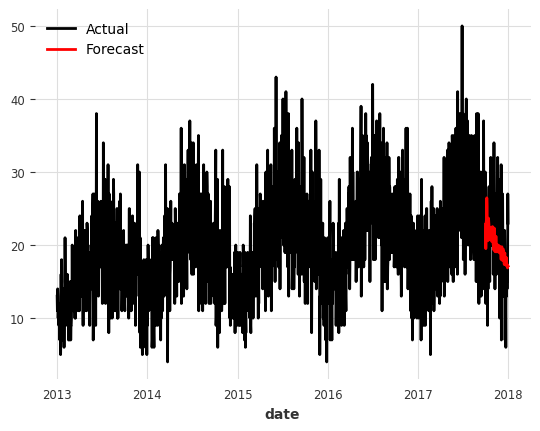

Mean absolute percentage error for the model: 25.87%.


In [99]:
forecast = scaler.inverse_transform(model.predict(len(val)))
series.plot(label='Actual')
forecast.plot(label='Forecast', color='red')
plt.legend()
plt.show()
print(
    f"Mean absolute percentage error for the model: {mape(val, forecast):.2f}%."
)

BEFORE Mean absolute percentage error for the model: 28.78%, after parameter tuning 25.87%.

Більше значення лагу збільшує помилку. Прогнозування на 6 крок вперед робить помилку меншою. Зменшення кількості дерев та максимальної глибини кожного також зменшує помилку. Ознаки по даті результату не дали.

Модель непогано прогнозує сезоне зниження продажів.

## ExponentialSmoothing

11. Натренуйте модель ExponentialSmoothing та зробіть висновок про її якість.

In [102]:
from darts.models import ExponentialSmoothing, AutoARIMA, Theta

def eval_forecast(model, val, forecast):
  mape_ = mape(val, forecast)
  print(f"model {model} obtains MAPE: {mape_:.2f}%")
  return mape_

def fit_eval_model(model):
    model.fit(train)
    forecast = model.predict(len(val))
    eval_forecast(model, val, forecast)

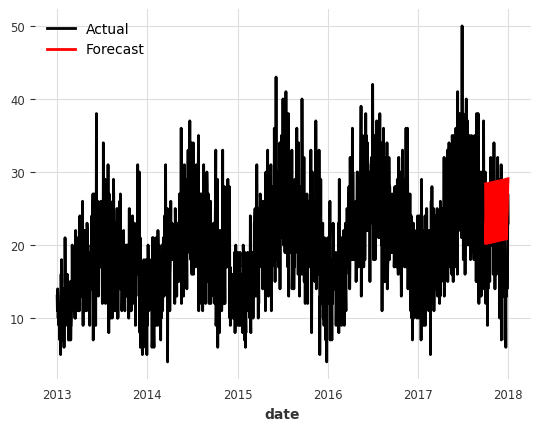

model ExponentialSmoothing() obtains MAPE: 39.01%


In [103]:
def plot_results(series, forecast):
  # Візуалізація результатів
  series.plot(label='Actual')
  forecast.plot(label='Forecast', color='red')
  plt.legend()
  plt.show()

def fit_and_plot(model, series, train, val):
  model.fit(train)
  forecast = model.predict(len(val))
  plot_results(series, forecast)
  eval_forecast(model, val, forecast);

model = ExponentialSmoothing()
fit_and_plot(model, series, train, val)

ExponentialSmoothing має дуже високу помилку у 39.01%. Тож якість її прогнозування дуже низька.

## ARIMA

12. Натренуйте модель ARIMA, параметри оберіть самостійно.Зробіть висновок про її якість.

 - p – Кількість автокореляційних лагів (AR)
 - d – Ступінь диференціювання (I) Визначає, скільки разів потрібно взяти різницю між значеннями, щоб зробити ряд стаціонарним.
 - q – Кількість лагів ковзного середнього (MA)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.



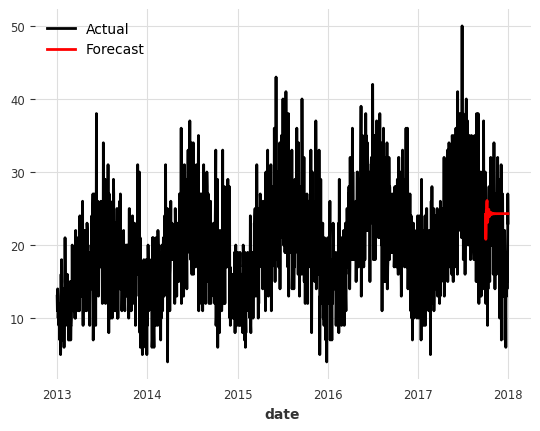

model ARIMA(p=7, q=1) obtains MAPE: 39.53%


In [110]:
from darts.models import ARIMA

# Побудова та тренування моделі ARIMA
model = ARIMA(p=7, d=1, q=1) # integration models: ARIMA(p, d, q)
fit_and_plot(model, series, train, val)

ARIMA погано прогнозує сезонні дані.

## AutoARIMA

13. Знайдіть оптимальні параметри моделі ARIMA з допомогою AutoARIMA моделі. Виконайте пошук параметрів, виведіть, які паарметри виявились оптимальними і обчисліть якість моделі. Чи поліпшилась якість порівняно з попереднім експериментом?

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all

AutoARIMA(add_encoders=None, start_p=4, max_p=8, start_q=3)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



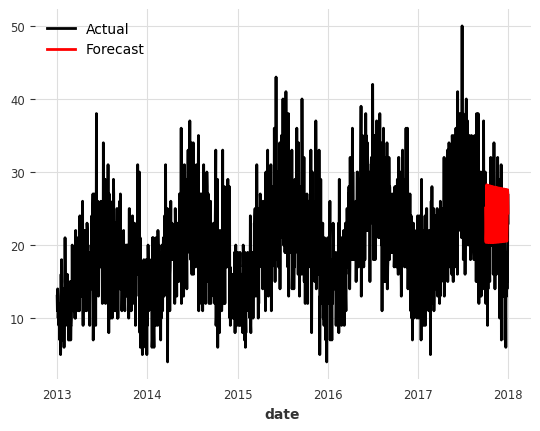

In [126]:
# Побудова та тренування моделі AutoArima
model = AutoARIMA(start_p=4, max_p=8, start_q=2) # спробуйте стартувати з інших значень і перегляньте, що виходить
model.fit(train)

display(model)

# Прогнозування
forecast = model.predict(len(val))

# Візуалізація результатів
plot_results(series, forecast)

In [124]:
model.model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1734
Model:               SARIMAX(6, 1, 5)   Log Likelihood               -5207.407
Date:                Tue, 18 Mar 2025   AIC                          10438.813
Time:                        21:22:22   BIC                          10504.304
Sample:                             0   HQIC                         10463.035
                               - 1734                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5870      0.031    -18.900      0.000      -0.648      -0.526
ar.L2          0.0757      0.035      2.141      0.032       0.006       0.145
ar.L3         -0.6223      0.019    -33.186      0.000      -0.659      -0.586
ar.L4         -0.9678      0.020    -48.442      0.000      -1.007      -0.929
ar.L5         -0.1233      0.034     -3.584      0.000      -0.191      -0.056
ar.L6         -0.1415      0.028     -5.047      0.000      -0.196      -0.087
ma.L1         -0.3494      0.023    -15.382      0.000      -0.394      -0.305
ma.L2         -0.6971      0.021    -32.988      0.000      -0.739      -0.656
ma.L3          0.7371      0.018     39.915      0.000       0.701       0.773
ma.L4          0.4820      0.023     21.229      0.000       0.437       0.526
ma.L5         -0.8201      0.020    -40.627      0.000      -0.860      -0.781
sigma2        24.3958      0.780     31.259      0.000      22.866      25.925
===================================================================================
Ljung-Box (L1) (Q):                   1.84   Jarque-Bera (JB):                24.90
Prob(Q):                              0.17   Prob(JB):                         0.00
Heteroskedasticity (H):               1.30   Skew:                             0.17
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [125]:
eval_forecast(model, val, forecast);

model AutoARIMA(start_p=6, max_p=14, start_q=5) obtains MAPE: 37.95%


37.95% найкращій результат який вийшов у AutoARIMA. Не дуже вражає.

## SARIMA

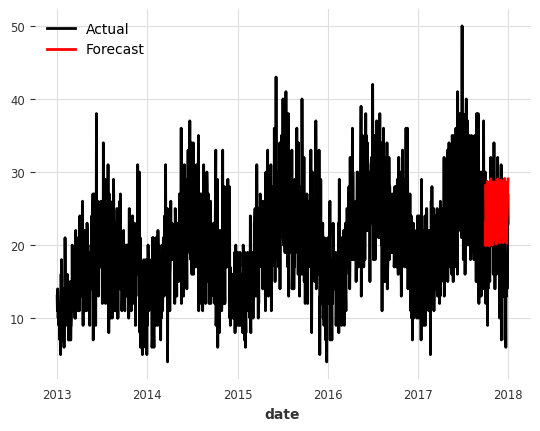

In [133]:
# Створення екзогенного часового ряду (наприклад, економічні показники)
exog = pd.DataFrame({
    'exog_var': np.random.randn(len(subset))
}, index=subset.index)
exog_series = TimeSeries.from_dataframe(exog)

# Поділ на тренувальні та тестові дані
train, test = series.split_before(pd.Timestamp('2017-10-01'))
train_exog, test_exog = exog_series.split_before(pd.Timestamp('2017-10-01'))

# Побудова та тренування моделі SARIMAX
model = ARIMA(1, 1, 1, seasonal_order=(1, 1, 1, 14))
model.fit(train, future_covariates=train_exog)

# Прогнозування
forecast = model.predict(len(test), future_covariates=test_exog)

# Візуалізація результатів
plot_results(series, forecast)

In [134]:
eval_forecast(model, val, forecast);

model ARIMA(p=1, q=1, seasonal_order=(1, 1, 1, 14)) obtains MAPE: 38.82%


## Prophet

14. Натренуйте модель Prophet та зробіть висновок про її якість.

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/sti8asih.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/d713rck3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30857', 'data', 'file=/tmp/tmpt300118_/sti8asih.json', 'init=/tmp/tmpt300118_/d713rck3.json', 'output', 'file=/tmp/tmpt300118_/prophet_modelyfugwir_/prophet_model-20250318212811.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:28:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:28:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


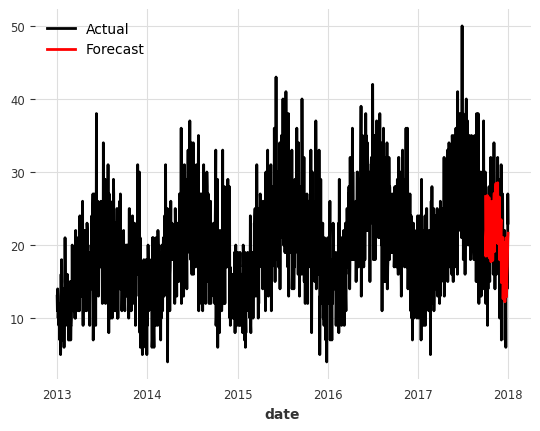

In [127]:
from darts.models import Prophet

# Побудова та тренування моделі Prophet
model = Prophet()
model.fit(train)

# Прогнозування
forecast = model.predict(len(val))

# Візуалізація результатів
series.plot(label='Actual')
forecast.plot(label='Forecast', color='red')
plt.legend()
plt.show()

In [128]:
eval_forecast(model, val, forecast);

model Prophet() obtains MAPE: 23.80%


Prophet видає найкращій результат 23.80%. Непогано передбачила низьсхідний період.

## RNNModel

15. Натренуйте модель `RNNModel` та зробіть висновок про її якість.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 2.8 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
2.8 K     Trainable params
0         Non-trainable params
2.8 K     Total params
0.011     Total estimated model params size (MB)
7         

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=300` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

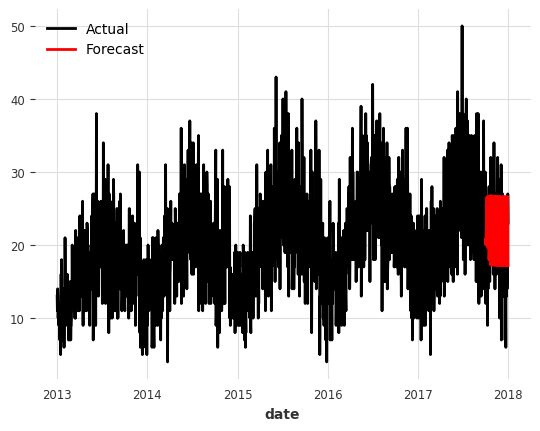

model RNNModel(model=LSTM, input_chunk_length=7, n_epochs=300) obtains MAPE: 36.87%


In [135]:
from darts.models import RNNModel

# Побудова та тренування моделі LSTM
model = RNNModel(model='LSTM', input_chunk_length=7, n_epochs=300)
model.fit(train)

# Прогнозування
forecast = model.predict(len(test))

# Візуалізація результатів
series.plot(label='Actual')
forecast.plot(label='Forecast', color='red')
plt.legend()
plt.show()

eval_forecast(model, val, forecast);

У RNNModel точність 36.87%, що є поганім прогнозуванням.

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 5.5 K  | train
6 | V               | Linear           | 31     | train
-------------------------------------------------------------
5.6 K     Trainable params
0         Non-trainable params
5.6 K     Total params
0.022     Total estimated model params size (MB)
7         

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

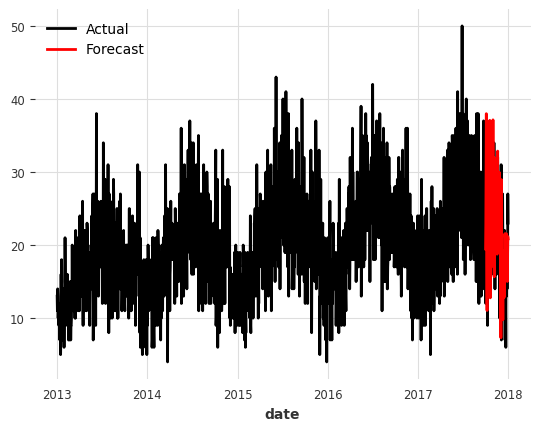

model RNNModel(model=LSTM, hidden_dim=30, training_length=32, input_chunk_length=30, batch_size=16, n_epochs=100, optimizer_kwargs={'lr': 0.001}, log_tensorboard=True, random_state=42, force_reset=True) obtains MAPE: 40.28%


In [140]:
from darts.utils.timeseries_generation import datetime_attribute_timeseries

# Масштабування даних
transformer = Scaler()
train_transformed = transformer.fit_transform(train)
val_transformed = transformer.transform(val)
series_transformed = transformer.transform(series)

# Створити серії з атрибутом року і місяця, using the length and frequency of your training data
year_series = datetime_attribute_timeseries(
    pd.date_range(start=train.start_time(), freq=train.freq_str, periods=len(train) + len(val)), # Use training data's start time and frequency
    attribute="year",
    one_hot=False,
)
year_series = Scaler().fit_transform(year_series)
month_series = datetime_attribute_timeseries(
    year_series, attribute="month", one_hot=True
)
covariates = year_series.stack(month_series)
cov_train, cov_val = covariates.split_before(val.start_time()) # Split covariates before the validation set

# Побудова та тренування моделі LSTM
model = RNNModel(
    model="LSTM",
    input_chunk_length=30, # вхідна довжина
    hidden_dim=30, # кількість нейронів у LSTM
    dropout=0,
    batch_size=16,
    n_epochs=100,
    optimizer_kwargs={"lr": 1e-3},
    log_tensorboard=True,
    random_state=42,
    training_length=32,
    force_reset=True,
)
model.fit(
    train_transformed,
    future_covariates=covariates,
    val_series=val_transformed,
    val_future_covariates=covariates,
    verbose=True)

# Прогнозування
forecast = scaler.inverse_transform(model.predict(len(test)))

# Візуалізація результатів
series.plot(label='Actual')
forecast.plot(label='Forecast', color='red')
plt.legend()
plt.show()

eval_forecast(model, val, forecast);

RNNModel з маштабуванням дає краще результат 29.93%.

## # Бектестинг: симуляція історичного прогнозування


16. Виконайте бектест для тої моделі, яка виявилась найкращою у вашому дослідженні на періоді 1 рік з передбаченнями на 1 місяць щоразу. Візуалізуйте як поводилась модель протягом бектесту, яка була точність?

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/m1isezca.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/7f_ndl9g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84512', 'data', 'file=/tmp/tmpt300118_/m1isezca.json', 'init=/tmp/tmpt300118_/7f_ndl9g.json', 'output', 'file=/tmp/tmpt300118_/prophet_modelgz0w1qua/prophet_model-20250318221128.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:11:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:11:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


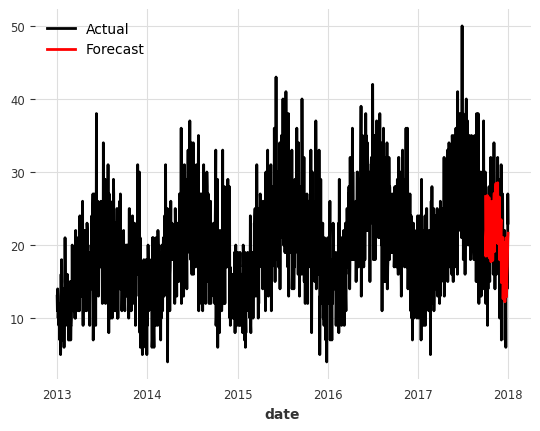

In [141]:
# Побудова та тренування моделі Prophet
model = Prophet()
model.fit(train)

# Прогнозування
forecast = model.predict(len(val))

# Візуалізація результатів
series.plot(label='Actual')
forecast.plot(label='Forecast', color='red')
plt.legend()
plt.show()

In [142]:
eval_forecast(model, val, forecast);

model Prophet() obtains MAPE: 23.80%


historical forecasts:   0%|          | 0/336 [00:00<?, ?it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/zjwf8228.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/k5yjdv89.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88179', 'data', 'file=/tmp/tmpt300118_/zjwf8228.json', 'init=/tmp/tmpt300118_/k5yjdv89.json', 'output', 'file=/tmp/tmpt300118_/prophet_model8y0ookce/prophet_model-20250318221907.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:19:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:19:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
historical forecasts:   0%|          | 1/336 [00:01<05:50,  1.05s/it]INFO:prophet

MAPE = 20.37%


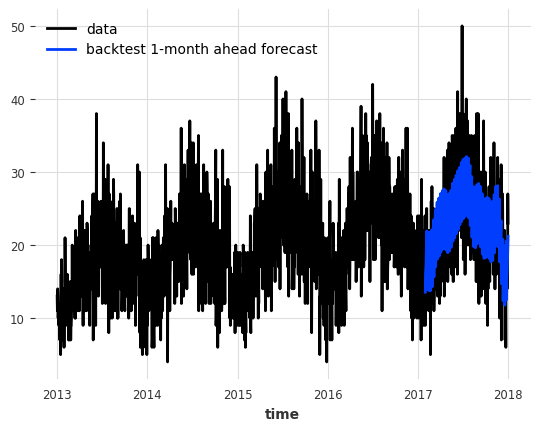

In [152]:
hfc_params = {
    "series": series,
    "start": pd.Timestamp("2017-01-01"),  # can also be a float for the fraction of the series to start at
    'forecast_horizon': 30,  # Прогноз на 30 днів (1 місяць)
    "verbose": True,
}

historical_fcast = model.historical_forecasts(last_points_only=True, **hfc_params)

series.plot(label="data")
historical_fcast.plot(label="backtest 1-month ahead forecast")
print(f"MAPE = {mape(series, historical_fcast):.2f}%")

MAPE = 20.37%

На бектесті точність Prophet трохи покращилась.

як  модель працювала б на історичних даних, якщо б ви використовували її для прогнозування в минулому.

historical forecasts:   0%|          | 0/12 [00:00<?, ?it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/ualito6e.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/qd2yrx3c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87598', 'data', 'file=/tmp/tmpt300118_/ualito6e.json', 'init=/tmp/tmpt300118_/qd2yrx3c.json', 'output', 'file=/tmp/tmpt300118_/prophet_model08q3lhic/prophet_model-20250318222822.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:28:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:28:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
historical forecasts:   8%|▊         | 1/12 [00:02<00:25,  2.30s/it]INFO:prophet:D

MAPE = 21.11%


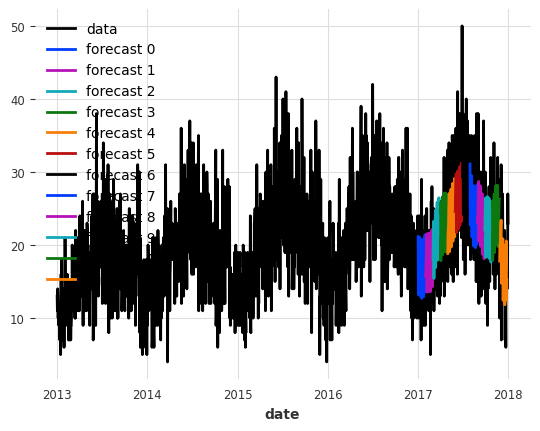

In [156]:
historical_fcast_all = model.historical_forecasts(last_points_only=False, stride=30, **hfc_params)

series.plot(label="data")
for idx, hfc in enumerate(historical_fcast_all):
    hfc.plot(label=f"forecast {idx}")

from darts import concatenate
historical_fcast_all = concatenate(historical_fcast_all, axis=0, ignore_time_axis=True)
print(f"MAPE = {mape(series, historical_fcast_all):.2f}%")

MAPE = 21.11%

помилки прогнозування для кожного кроку бектестингу

historical forecasts:   0%|          | 0/12 [00:00<?, ?it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/9yrdqz8x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/zgb8hxkv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13969', 'data', 'file=/tmp/tmpt300118_/9yrdqz8x.json', 'init=/tmp/tmpt300118_/zgb8hxkv.json', 'output', 'file=/tmp/tmpt300118_/prophet_modelfnb8365m/prophet_model-20250318223041.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:30:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:30:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
historical forecasts:   8%|▊         | 1/12 [00:00<00:09,  1.17it/s]INFO:prophet:D

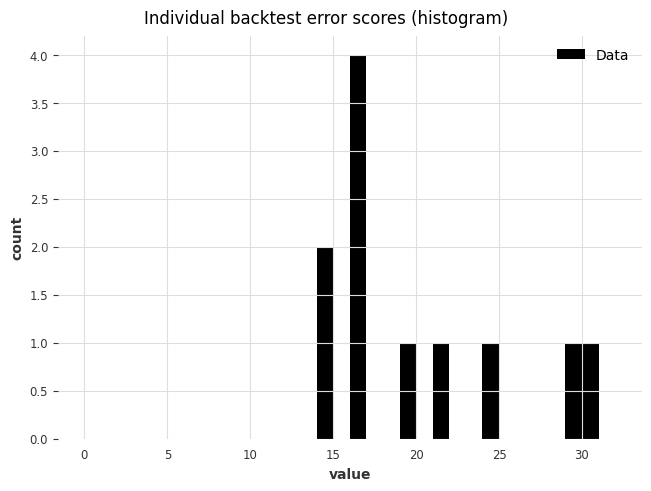

In [158]:
raw_errors = model.backtest(metric=mape, reduction=None, last_points_only=False, stride=30, **hfc_params)

from darts.utils.statistics import plot_hist

plot_hist(
    raw_errors,
    bins=np.arange(0, max(raw_errors), 1),
    title="Individual backtest error scores (histogram)",
)

In [159]:
average_error = model.backtest(
    metric=mape,
    reduction=np.mean,  # this is actually the default
    **hfc_params
)

print(f"Average error (MAPE) over all historical forecasts: {average_error:.2f}")

historical forecasts:   0%|          | 0/336 [00:00<?, ?it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/zjhrfzt_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/4psq1yfe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36468', 'data', 'file=/tmp/tmpt300118_/zjhrfzt_.json', 'init=/tmp/tmpt300118_/4psq1yfe.json', 'output', 'file=/tmp/tmpt300118_/prophet_modelig2xzobc/prophet_model-20250318223857.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:38:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:38:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
historical forecasts:   0%|          | 1/336 [00:00<01:48,  3.10it/s]INFO:prophet

Average error (MAPE) over all historical forecasts: 20.43


Average error (MAPE) over all historical forecasts: 20.43

В середньому модель помиляється на 20.43% від реальних значень. Це не дуже добре, треба експерементувати з фічами та іншими методами покращення точності.

медіанне MAPE та бектестинг із заздалегідь обчисленими прогнозами

In [163]:
hfc_precomputed = model.historical_forecasts(last_points_only=False, stride=30, **hfc_params)
new_error = model.backtest(historical_forecasts=hfc_precomputed, last_points_only=False, stride=30, **hfc_params)

print(f"Average error (MAPE) over all historical forecasts: {new_error:.2f}")

historical forecasts:   0%|          | 0/12 [00:00<?, ?it/s]INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/gtev9fic.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/z0wor95b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42199', 'data', 'file=/tmp/tmpt300118_/gtev9fic.json', 'init=/tmp/tmpt300118_/z0wor95b.json', 'output', 'file=/tmp/tmpt300118_/prophet_modelhsgul1e7/prophet_model-20250318224740.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:47:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:47:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
historical forecasts:   8%|▊         | 1/12 [00:00<00:03,  3.18it/s]INFO:prophet:D

Average error (MAPE) over all historical forecasts: 21.11


21.11%

Огляд залишків

Streaming output truncated to the last 5000 lines.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/3121j1l7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpt300118_/w_4ge335.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35790', 'data', 'file=/tmp/tmpt300118_/3121j1l7.json', 'init=/tmp/tmpt300118_/w_4ge335.json', 'output', 'file=/tmp/tmpt300118_/prophet_modeljydjt7ir/prophet_model-20250318225419.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:54:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:54:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to overri

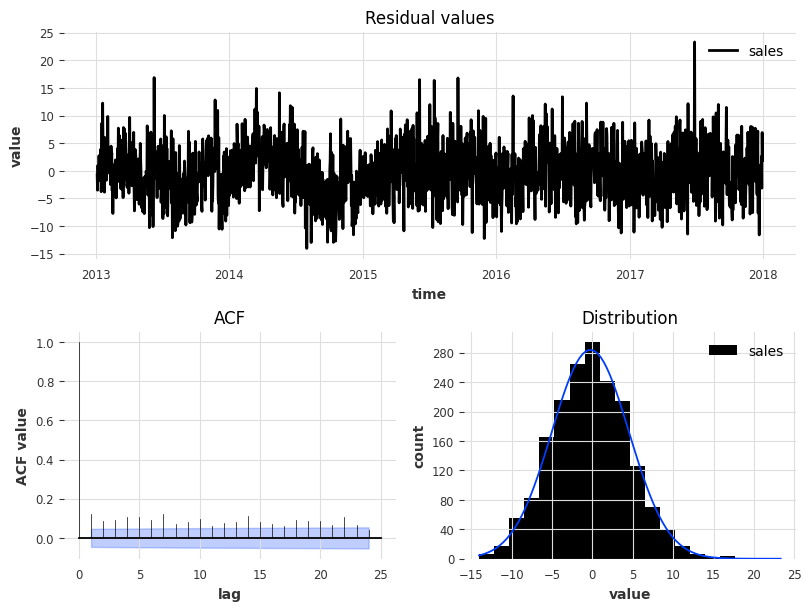

In [164]:
from darts.utils.statistics import plot_residuals_analysis

plot_residuals_analysis(model.residuals(series))

Розподіл нормальний і центрований на 0, модель не є упередженою.

historical forecasts: 100%|██████████| 336/336 [00:11<00:00, 28.80it/s]


MAPE = 20.78%


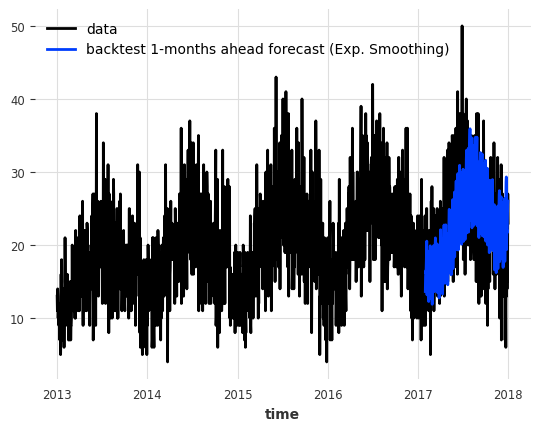

In [167]:
model_theta = Theta(-3.5)
historical_fcast_theta = model_theta.historical_forecasts(**hfc_params)

series.plot(label="data")
historical_fcast_theta.plot(label="backtest 1-months ahead forecast (Exp. Smoothing)")
print(f"MAPE = {mape(historical_fcast_theta, series):.2f}%")

Всю варіантивність не вгадали, але виглядає непогано!

17. На цьому етапі ви зрозуміли, як моделювати продажі одного айтему з 1 магазину. Як би ви підійшли до задачі прогнозування продажів в наступному місяці для кожного з 50 айтемів в кожному з 10 магазинів? Опишіть загальний підхід
- яку модель ви б використали
- скільки моделей ви б тренували
- обгрунтуйте свій вибір.

Для тренування 500 часових рядків (50 товарів × 10 магазинів) одночасно можно було б використати глобальну нейрону модель LSTM, бо вона саме для цього. Або більш довше, але більше точніше навчати окремі моделі для кожного айтему з циклом у Prophet. Можливо можно було б додати нові фічі, використовувати бектестінг для оцінки.

Prophet добре працює з трендами і сезонністю, автоматично обробляє відсутні значення, аномалії та викиди. У даних чітка сезонність и Prophet добре її улавлює. Тож другий варіант з циклами в Prophet спрацював би найкраще на цих даних.